# Convolutional Variational Autoencoder for CelebA Face Images

In [ ]:
%pip install ipympl
%pip install torchinfo

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [ ]:
%reload_ext autoreload
%autoreload 2

%matplotlib widget

## Imports

In [ ]:
import torch
import torchvision
import torch.nn as nn
import matplotlib.pyplot as plt


import os

from torch.utils.data import DataLoader
#from tqdm.notebook import tqdm
#import tqdm
from tqdm.notebook import tqdm_notebook

import matplotlib.pyplot as plt
import pandas as pd
import numpy as np
import torch.nn.functional as F

%matplotlib inline

In [ ]:

from google.colab import drive

drive.mount("/content/drive", force_remount=True)
%cd '/content/drive/My Drive/Colab Notebooks/Labs/GANs'


Mounted at /content/drive
/content/drive/My Drive/Colab Notebooks/Labs/GANs


In [ ]:
!nvidia-smi

Sun Nov 27 14:59:05 2022       
+-----------------------------------------------------------------------------+
| NVIDIA-SMI 460.32.03    Driver Version: 460.32.03    CUDA Version: 11.2     |
|-------------------------------+----------------------+----------------------+
| GPU  Name        Persistence-M| Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf  Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|                               |                      |               MIG M. |
|===============================+======================+======================|
|   0  Tesla T4            Off  | 00000000:00:04.0 Off |                    0 |
| N/A   44C    P8     9W /  70W |      0MiB / 15109MiB |      0%      Default |
|                               |                      |                  N/A |
+-------------------------------+----------------------+----------------------+
                                                                               
+-------

## Model

In [ ]:
##########################
### MODEL
##########################


class Reshape(nn.Module):
    def __init__(self, *args):
        super().__init__()
        self.shape = args

    def forward(self, x):
        return x.view(self.shape)


class VAE(nn.Module):
    def __init__(self):
        super().__init__()

        self.encoder = nn.Sequential(
            nn.Conv2d(3, 128, stride=2, kernel_size=3, bias=False, padding=0),
            nn.BatchNorm2d(128),
            nn.LeakyReLU(0.1, inplace=True),
            nn.Dropout2d(0.2),
            
            nn.Conv2d(128, 128, stride=1, kernel_size=3, bias=False, padding=0),
            nn.BatchNorm2d(128),
            nn.LeakyReLU(0.1, inplace=True),
            nn.Dropout2d(0.2),
            
            nn.Conv2d(128, 64, stride=2, kernel_size=3, bias=False, padding=0),
            nn.BatchNorm2d(64),
            nn.LeakyReLU(0.1, inplace=True),
            nn.Dropout2d(0.2),
            
            nn.Conv2d(64, 64, stride=2, kernel_size=3, bias=False, padding=0),
            nn.BatchNorm2d(64),
            nn.LeakyReLU(0.1, inplace=True),
            nn.Dropout2d(0.2),
            
            nn.Conv2d(64, 32, stride=1, kernel_size=3, bias=False, padding=0),
            nn.BatchNorm2d(32),
            nn.LeakyReLU(0.1, inplace=True),
            nn.Dropout2d(0.2),
            
            nn.Conv2d(32, 32, stride=1, kernel_size=3, bias=False, padding=0),
            nn.BatchNorm2d(32),
            nn.LeakyReLU(0.1, inplace=True),
            nn.Dropout2d(0.25),
            
            nn.Flatten(),
        )


        self.decoder = nn.Sequential(
            torch.nn.Linear(400, 4096),
            Reshape(-1, 64, 8, 8),
            #
            nn.ConvTranspose2d(64, 128, stride=1, kernel_size=3, padding=1),
            nn.BatchNorm2d(128),
            nn.LeakyReLU(0.1, inplace=True),
            nn.Dropout2d(0.15),
            #
            nn.ConvTranspose2d(128, 128, stride=2, kernel_size=3, padding=1),
            nn.BatchNorm2d(128),
            nn.LeakyReLU(0.1, inplace=True),
            nn.Dropout2d(0.15),
            
            nn.ConvTranspose2d(128, 64, stride=2, kernel_size=3, padding=0),
            nn.BatchNorm2d(64),
            nn.LeakyReLU(0.1, inplace=True),
            nn.Dropout2d(0.15),
            
            nn.ConvTranspose2d(64, 64, stride=2, kernel_size=3, padding=0),
            nn.BatchNorm2d(64),
            nn.LeakyReLU(0.1, inplace=True),
            nn.Dropout2d(0.15),
            
            nn.ConvTranspose2d(64, 32, stride=2, kernel_size=3, padding=1),
            nn.BatchNorm2d(32),
            nn.LeakyReLU(0.1, inplace=True),
            nn.Dropout2d(0.15),
            
            nn.ConvTranspose2d(32, 32, stride=1, kernel_size=3, padding=0),
            nn.BatchNorm2d(32),
            nn.LeakyReLU(0.1, inplace=True),
            nn.Dropout2d(0.15),
            
            nn.ConvTranspose2d(32, 3, stride=1, kernel_size=3, padding=0),
            
            nn.Tanh(),
        )

        self.z_mean = torch.nn.Linear(3200, 400)
        self.z_log_var = torch.nn.Linear(3200, 400)

    def encode(self, x):
        x = self.encoder(x)
        z_mean, z_log_var = self.z_mean(x), self.z_log_var(x)
        encoded = self.reparameterize(z_mean, z_log_var)
        
        return encoded, z_mean, z_log_var
    
    def decode(self, x):
        return self.decoder(x)
    
    def reparameterize(self, z_mu, z_log_var):
        eps = torch.randn(z_mu.size(0), z_mu.size(1)).to(z_mu.get_device())
        z = z_mu + eps * torch.exp(z_log_var / 2.0)
        
        return z
        
    def forward(self, x):
        encoded, z_mean, z_log_var = self.encode(x)
        decoded = self.decode(encoded)
        
        decoded =decoded[:,:,:128,:128 ]
        
        return encoded, z_mean, z_log_var, decoded

In [ ]:
from utils.utils_cuda import get_device

DEVICE=get_device()

Device: cuda:0
Name of current CUDA device: Tesla T4


### Test the VAE

In [ ]:
batch_size=8

input_vae = torch.rand(batch_size, 3, 128, 128, dtype=torch.float32, device=DEVICE)

model = VAE().to(DEVICE).eval()
encoded, z_mean, z_log_var, decoded = model(input_vae)

print('encoded: ',  type(encoded),      encoded.shape)
print('z_mean: ',   type(z_mean),       z_mean.shape)
print('z_log_var: ',type(z_log_var),    z_log_var.shape)
print('decoded: ',  type(decoded),      decoded.shape)

encoded:  <class 'torch.Tensor'> torch.Size([8, 400])
z_mean:  <class 'torch.Tensor'> torch.Size([8, 400])
z_log_var:  <class 'torch.Tensor'> torch.Size([8, 400])
decoded:  <class 'torch.Tensor'> torch.Size([8, 3, 128, 128])


#### VAE Architecture

In [ ]:
from torchinfo import summary

summary(model, input_size=(batch_size, 3, 128, 128), device=DEVICE)

Layer (type:depth-idx)                   Output Shape              Param #
VAE                                      [8, 400]                  --
├─Sequential: 1-1                        [8, 3200]                 --
│    └─Conv2d: 2-1                       [8, 128, 63, 63]          3,456
│    └─BatchNorm2d: 2-2                  [8, 128, 63, 63]          256
│    └─LeakyReLU: 2-3                    [8, 128, 63, 63]          --
│    └─Dropout2d: 2-4                    [8, 128, 63, 63]          --
│    └─Conv2d: 2-5                       [8, 128, 61, 61]          147,456
│    └─BatchNorm2d: 2-6                  [8, 128, 61, 61]          256
│    └─LeakyReLU: 2-7                    [8, 128, 61, 61]          --
│    └─Dropout2d: 2-8                    [8, 128, 61, 61]          --
│    └─Conv2d: 2-9                       [8, 64, 30, 30]           73,728
│    └─BatchNorm2d: 2-10                 [8, 64, 30, 30]           128
│    └─LeakyReLU: 2-11                   [8, 64, 30, 30]           --


In [ ]:
from torch.utils.tensorboard import SummaryWriter
from pathlib import Path

from utils.gans.gans_statistics_utils import GANStatisticsSaver
from utils.gans.gans_folders import FolderStructure
from utils.utils_cuda import clear_cuda_cache



### Trainning


In [ ]:
import time
    
class VAE_Trainer(object):
    def __init__(
        self,
        model:VAE,
        test_loader:DataLoader,
        folder_structure: FolderStructure = FolderStructure(trainning_output =Path('trainings_output') / Path('VAE_training_output'))
    ):

        self.net_VAE = model
        self.test_loader = test_loader

        self.folder_structure = folder_structure
       
        # (tensorboard) writer will output to ./runs/ directory by default
        self.writer = SummaryWriter(log_dir=self.folder_structure.tensorboard_folder)
        %reload_ext tensorboard
        #test this:
        #%tensorboard --logdir SNGAN_training_output/Tensorboard_runs

    def get_loss(self, decoded, features, z_mean, z_log_var):
        MSL = F.mse_loss(decoded, features,reduction='none')
        MSL = MSL.view(features.shape[0], -1).sum(axis=1)
        MSL = MSL.mean() 
        
        KLD = -0.5 * torch.sum(
                1 + z_log_var - z_mean.pow(2)- torch.exp(z_log_var),
                axis=1
            )  # KL Divergence from MIT 6.S191
        KLD = KLD.mean()  # average over batch dimension
        
        return MSL, KLD


    def record_evaluations(self, ganStatisticsSaver:GANStatisticsSaver, 
                           loss, MSL, KLD,
                        train_loader_length,epoch, batch_idx):
                 
        combined_loss = np.round(loss.item(), 2)
        msl_loss      = np.round(MSL.item(), 2)
        kl_div_loss   = np.round(KLD.item(), 2)
        
        self.writer.add_scalars('VAE_LOSS', {'MSL_LOSS':      msl_loss,
                                             'KL_DIV':   kl_div_loss},
                                            train_loader_length * epoch + batch_idx + 1)
        self.writer.add_scalars('BCE_LOSS', {'MSL_LOSS':   msl_loss},
                                            train_loader_length * epoch + batch_idx + 1)
        self.writer.add_scalars('KL_DIV_LOSS', {'KL_DIV_LOSS': kl_div_loss},
                                            train_loader_length * epoch + batch_idx + 1)
        self.writer.add_scalars('VAE_LOSS_TOTAL', {'COMBINED_LOSS': combined_loss},
                                            train_loader_length * epoch + batch_idx + 1)

        ganStatisticsSaver.save_train_generator_loss_per_batch(combined_loss)

    # generate the debug imagery on current generator model
    def save_images(self,model:nn.Module,features, ganStatisticsSaver:GANStatisticsSaver,epoch,batch_idx, is_debug=False):
        model.eval()
        
        log_list_generated_images =[]
        with torch.no_grad():
            _, _, _, decoded_images = model(features)
        
        log_list_generated_images.append(decoded_images.detach().cpu())
        log_list_generated_images=torch.cat(log_list_generated_images, dim=0) 

        # resize generated debug imagery for easier viewing if desired
        #log_generated_images_resized = nn.Upsample(scale_factor=2, mode='nearest')(log_list_generated_images)

        intermediate_imagery_grid = torchvision.utils.make_grid(
                            log_list_generated_images, nrow=features.shape[0], 
                            padding=1,normalize = True) # value_range=(-1,1) producing unclear images
        
        ''' 
        for batch_idx, (features, _) in enumerate(self.test_loader):
            features = features.to(DEVICE)
            
            encoded, z_mean, z_log_var, decoded_images = self.net_VAE(features)
            decoded_images=decoded_images.detach().cpu()
            log_list_generated_images.append(decoded_images)
                    
        ''' 
        
        #add epoch images
        if not is_debug:
            id = str(epoch)
            # also save images to disk
            ganStatisticsSaver.save_images_normalized_to_folder(log_list_generated_images, 
                                                     self.folder_structure.trainning_images_generated,
                                                     id)

            self.writer.add_image('trainning generated images', 
                                  intermediate_imagery_grid, 
                                epoch  + 1)
        #add debug images
        else:
            id = str(epoch) + '_' + str(batch_idx)
            ganStatisticsSaver.save_images_normalized_to_folder(
                        log_list_generated_images, self.folder_structure.debug_images_generated, id)  
        
        model.train()
        
    def train_vae(self,        
        optimizer,
        train_loader:DataLoader,
        ganStatisticsSaver: GANStatisticsSaver,
        epochs_range=(0, 10)
    ):

        image, _ = next(iter(train_loader))
        self.batch_size = image.shape[0]
        self.net_VAE.to(DEVICE)
        image = image.to(DEVICE)
        
        
        self.net_VAE.eval()
        #the warnings from output are from tensorboard api 
        with torch.no_grad():
            self.writer.add_graph(self.net_VAE, image,use_strict_trace=True)
    
        self.net_VAE.train()
        
        _ = time.time()
        
        for epoch in range(epochs_range[0], epochs_range[1]):
            clear_cuda_cache()
            
            for batch_idx, (features, _) in enumerate(tqdm_notebook(iterable=train_loader, desc='epoch '+str(epoch), total=len(train_loader)), 0):
                features = features.to(DEVICE, non_blocking=True)
                
                _, z_mean, z_log_var, decoded = self.net_VAE(features)
                
                MSL, KLD = self.get_loss(decoded, features, z_mean, z_log_var)

                loss = MSL + 0.06*KLD
                assert not torch.isnan(loss).any()
                
                optimizer.zero_grad()
                loss.backward()

                optimizer.step()

                # show generated images in TensorBoard for easy tracking of training progress
                # don't compute gradients on debug imagery
                self.record_evaluations(ganStatisticsSaver, 
                                        loss, MSL, KLD,  
                                        len(train_loader), epoch, batch_idx)

                #debug images
                DEBUG_IMG=True
                if DEBUG_IMG and (batch_idx % int(len(train_loader)/5) == 0):
                  with torch.no_grad():
                    self.save_images(self.net_VAE,features, ganStatisticsSaver,
                                     epoch,batch_idx,
                                     is_debug=True)
            
            with torch.no_grad():
                self.save_images(self.net_VAE, features,ganStatisticsSaver,
                                 epoch,batch_idx,
                                     is_debug=False)
        
            # save a checkpoint of the VAE every epoch
            # performance often degrades past a certain epoch and may not recover
            torch.save({
                    'epoch': epoch,
                    'model_state_dict': self.net_VAE.state_dict(),
                    'optimizer_state_dict': optimizer.state_dict(),
                    'loss': loss.item(),
                }, self.folder_structure.get_path_checkpoints_for_file( 'vae_checkpoint_epoch_' 
                                                        + str(epoch) + '.pt')) 
        torch.save(
            {
                "epoch": epoch,
                "model_state_dict": self.net_VAE.state_dict(),
                "optimizer_state_dict": optimizer.state_dict()
            },
            self.folder_structure.trainning_final_model_folder / Path("file_vae_model" + "_params.pt")
            )
        
        self.writer.flush()
        self.writer.close()
        


### Load the dataset

In [ ]:
from utils_data.utils_data_load import get_celeba_datasets, get_celeba_dataloaader_test
from utils.utils_cuda import clear_cuda_cache, get_device

DEVICE=get_device()
image_size=128
BATCH_SIZE = 32

train_loader = get_celeba_datasets(batch_size=BATCH_SIZE)

print('train loader lenghth', len(train_loader))
images, _ = next(iter(train_loader))
print('images shape: ', images.shape)

Device: cuda:0
Name of current CUDA device: Tesla T4
train loader lenghth 1877
images shape:  torch.Size([32, 3, 128, 128])


## Training

In [ ]:
TESTING_MODEL=False
#TESTING_MODEL=True


if TESTING_MODEL:
    train_loader=test_loader

In [ ]:
import os

from utils.utils_cuda import clear_cuda_cache, get_device
from utils.utils_cuda import seed_everything

os.environ['CUDA_LAUNCH_BLOCKING'] = "1"

clear_cuda_cache()
DEVICE=get_device()

seed_everything(seed=42)

In [ ]:
from utils.gans.utils_gan import weights_init

def get_vae_model():
    model = VAE()
    model.apply(weights_init)
    model.to(DEVICE)
    
    return model

LEARNING_RATE = 0.0003
def get_vae_optimizer(model:nn.Module, LEARNING_RATE = LEARNING_RATE):
    optimizer = torch.optim.AdamW(model.parameters(), 
                                  lr=LEARNING_RATE,
                                betas=(0.5, 0.999))
    return optimizer


In [ ]:
tensorboard_folder = FolderStructure(trainning_output = Path('trainings_output') / Path('VAE_training_output')).get_tensorboard_folder()

%reload_ext tensorboard
%tensorboard --logdir ./trainings_output/VAE_training_output/Tensorboard_runs


Output hidden; open in https://colab.research.google.com to view.

In [ ]:
model = get_vae_model()
optimizer_vae = get_vae_optimizer(model)

folder_structure = FolderStructure(trainning_output = Path('trainings_output') / Path('VAE_training_output'))

# remove prevoius training output if training is not restarted from a checkpoint 
REMOVE_PREVIOUSE_TRAINNING_OUTPUT = True

if REMOVE_PREVIOUSE_TRAINNING_OUTPUT:
    folder_structure.remove_trainning_folder_output()
    
    #create or clear folders if training is restarted or training models are not loaded
    folder_structure.create_folders()
    folder_structure.clean_folders()

trainer = VAE_Trainer(
    model, test_loader, folder_structure = folder_structure
)

ganStatisticsSaver = GANStatisticsSaver()

NUM_EPOCHS_END = 10
NUM_EPOCHS_START = 0

# use main method for lunch if dataloader has the number of jobs set
if __name__ == '__main__':
    trainer.train_vae(optimizer_vae,
                      train_loader, 
                      ganStatisticsSaver,
                  epochs_range=(NUM_EPOCHS_START, NUM_EPOCHS_END),
                  )
    
    trainer = None

/usr/local/lib/python3.7/dist-packages/torch/jit/_trace.py:1000: TracerWarning: Trace had nondeterministic nodes. Did you forget call .eval() on your model? Nodes:
	%459 : Float(32, 400, strides=[400, 1], requires_grad=0, device=cpu) = aten::randn(%454, %455, %456, %457, %458) # <ipython-input-6-b579dc4da75f>:107:0
This may cause errors in trace checking. To disable trace checking, pass check_trace=False to torch.jit.trace()
  _module_class,
/usr/local/lib/python3.7/dist-packages/torch/jit/_trace.py:1000: TracerWarning: Output nr 1. of the traced function does not match the corresponding output of the Python function. Detailed error:
Tensor-likes are not close!

Mismatched elements: 12800 / 12800 (100.0%)
Greatest absolute difference: 6.098131895065308 at index (28, 192) (up to 1e-05 allowed)
Greatest relative difference: 48726.46281286802 at index (30, 192) (up to 1e-05 allowed)
  _module_class,
/usr/local/lib/python3.7/dist-packages/torch/jit/_trace.py:1000: TracerWarning: Output nr 

epoch 0:   0%|          | 0/1877 [00:00<?, ?it/s]

epoch 1:   0%|          | 0/1877 [00:00<?, ?it/s]

epoch 2:   0%|          | 0/1877 [00:00<?, ?it/s]

epoch 3:   0%|          | 0/1877 [00:00<?, ?it/s]

epoch 4:   0%|          | 0/1877 [00:00<?, ?it/s]

epoch 5:   0%|          | 0/1877 [00:00<?, ?it/s]

epoch 6:   0%|          | 0/1877 [00:00<?, ?it/s]

epoch 7:   0%|          | 0/1877 [00:00<?, ?it/s]

epoch 8:   0%|          | 0/1877 [00:00<?, ?it/s]

epoch 9:   0%|          | 0/1877 [00:00<?, ?it/s]

epoch 10:   0%|          | 0/1877 [00:00<?, ?it/s]

### Start trainning the VAE from a loaded model

In [ ]:

NUMBER_EPOCHS_TO_TRAIN=55
    
model = get_vae_model()
optimizer_vae = get_vae_optimizer(model)

folder_structure = FolderStructure(trainning_output = Path('trainings_output') / Path('VAE_training_output'))
model_dict_values = torch.load(folder_structure.trainning_final_model_folder / Path("file_vae_model" + "_params.pth"))

model.load_state_dict(model_dict_values["model_state_dict"])
optimizer_vae.load_state_dict(model_dict_values["optimizer_state_dict"])
last_epoch = model_dict_values["epoch"]


trainer = VAE_Trainer(
    model=model, test_loader=test_loader, 
    folder_structure = folder_structure
)

ganStatisticsSaver = GANStatisticsSaver()     

NUM_EPOCHS_START = last_epoch + 1
NUM_EPOCHS_END = NUM_EPOCHS_START + NUMBER_EPOCHS_TO_TRAIN

trainer.train_vae(optimizer_vae,
                    train_loader, 
                    ganStatisticsSaver,
                    epochs_range=(NUM_EPOCHS_START, NUM_EPOCHS_END)
                )    


/usr/local/lib/python3.7/dist-packages/torch/jit/_trace.py:1000: TracerWarning: Trace had nondeterministic nodes. Did you forget call .eval() on your model? Nodes:
	%459 : Float(32, 400, strides=[400, 1], requires_grad=0, device=cpu) = aten::randn(%454, %455, %456, %457, %458) # <ipython-input-6-b579dc4da75f>:107:0
This may cause errors in trace checking. To disable trace checking, pass check_trace=False to torch.jit.trace()
  _module_class,
/usr/local/lib/python3.7/dist-packages/torch/jit/_trace.py:1000: TracerWarning: Output nr 1. of the traced function does not match the corresponding output of the Python function. Detailed error:
Tensor-likes are not close!

Mismatched elements: 12788 / 12800 (99.9%)
Greatest absolute difference: 0.48682737350463867 at index (2, 323) (up to 1e-05 allowed)
Greatest relative difference: 345.00164865359955 at index (11, 394) (up to 1e-05 allowed)
  _module_class,
/usr/local/lib/python3.7/dist-packages/torch/jit/_trace.py:1000: TracerWarning: Output nr

epoch 10:   0%|          | 0/1877 [00:00<?, ?it/s]

epoch 11:   0%|          | 0/1877 [00:00<?, ?it/s]

epoch 12:   0%|          | 0/1877 [00:00<?, ?it/s]

epoch 13:   0%|          | 0/1877 [00:00<?, ?it/s]

epoch 14:   0%|          | 0/1877 [00:00<?, ?it/s]

epoch 15:   0%|          | 0/1877 [00:00<?, ?it/s]

epoch 16:   0%|          | 0/1877 [00:00<?, ?it/s]

epoch 17:   0%|          | 0/1877 [00:00<?, ?it/s]

epoch 18:   0%|          | 0/1877 [00:00<?, ?it/s]

epoch 19:   0%|          | 0/1877 [00:00<?, ?it/s]

epoch 20:   0%|          | 0/1877 [00:00<?, ?it/s]

epoch 21:   0%|          | 0/1877 [00:00<?, ?it/s]

epoch 22:   0%|          | 0/1877 [00:00<?, ?it/s]

epoch 23:   0%|          | 0/1877 [00:00<?, ?it/s]

epoch 24:   0%|          | 0/1877 [00:00<?, ?it/s]

epoch 25:   0%|          | 0/1877 [00:00<?, ?it/s]

epoch 26:   0%|          | 0/1877 [00:00<?, ?it/s]

epoch 27:   0%|          | 0/1877 [00:00<?, ?it/s]

epoch 28:   0%|          | 0/1877 [00:00<?, ?it/s]

epoch 29:   0%|          | 0/1877 [00:00<?, ?it/s]

epoch 30:   0%|          | 0/1877 [00:00<?, ?it/s]

epoch 31:   0%|          | 0/1877 [00:00<?, ?it/s]

epoch 32:   0%|          | 0/1877 [00:00<?, ?it/s]

epoch 33:   0%|          | 0/1877 [00:00<?, ?it/s]

epoch 34:   0%|          | 0/1877 [00:00<?, ?it/s]

epoch 35:   0%|          | 0/1877 [00:00<?, ?it/s]

epoch 36:   0%|          | 0/1877 [00:00<?, ?it/s]

epoch 37:   0%|          | 0/1877 [00:00<?, ?it/s]

epoch 38:   0%|          | 0/1877 [00:00<?, ?it/s]

epoch 39:   0%|          | 0/1877 [00:00<?, ?it/s]

epoch 40:   0%|          | 0/1877 [00:00<?, ?it/s]

epoch 41:   0%|          | 0/1877 [00:00<?, ?it/s]

epoch 42:   0%|          | 0/1877 [00:00<?, ?it/s]

epoch 43:   0%|          | 0/1877 [00:00<?, ?it/s]

epoch 44:   0%|          | 0/1877 [00:00<?, ?it/s]

epoch 45:   0%|          | 0/1877 [00:00<?, ?it/s]

epoch 46:   0%|          | 0/1877 [00:00<?, ?it/s]

epoch 47:   0%|          | 0/1877 [00:00<?, ?it/s]

epoch 48:   0%|          | 0/1877 [00:00<?, ?it/s]

epoch 49:   0%|          | 0/1877 [00:00<?, ?it/s]

epoch 50:   0%|          | 0/1877 [00:00<?, ?it/s]

epoch 51:   0%|          | 0/1877 [00:00<?, ?it/s]

epoch 52:   0%|          | 0/1877 [00:00<?, ?it/s]

epoch 53:   0%|          | 0/1877 [00:00<?, ?it/s]

epoch 54:   0%|          | 0/1877 [00:00<?, ?it/s]

epoch 55:   0%|          | 0/1877 [00:00<?, ?it/s]

## Evaluation

In [ ]:
NUM_EPOCHS = NUM_EPOCHS_END + 1

from utils.utils_plotting import (
    plot_trainning_eval
)


plot_trainning_eval(
    ganStatisticsSaver.train_generator_loss_per_batch,
    num_epochs=NUM_EPOCHS,
    type_plot="Loss",
    custom_label=" VAE",
)

In [ ]:
from utils_data.utils_folders import write_to_disk_images_stacked

folder_structure = FolderStructure(trainning_output = Path('trainings_output') / Path('VAE_training_output'))

resulting_images = write_to_disk_images_stacked(folder_source_imgs=folder_structure.trainning_images_generated,
                             folder_output_batches_stacked=folder_structure.stacks_images_generated,
                             folder_output_all_stacked=folder_structure.one_stack_images_generated,
                             num_epochs=NUM_EPOCHS)

### Load model if necesary

In [ ]:

model = get_vae_model()
optimizer_vae = get_vae_optimizer(model)
folder_structure = FolderStructure(trainning_output = Path('trainings_output') / Path('VAE_training_output'))
model_dict_values = torch.load(folder_structure.trainning_final_model_folder / Path("file_vae_model" + "_params.pth"))

model.load_state_dict(model_dict_values["model_state_dict"])
optimizer_vae.load_state_dict(model_dict_values["optimizer_state_dict"])
last_epoch = model_dict_values["epoch"]


In [ ]:
#NUM_EPOCHS=last_epoch

54

### Plot generated images

In [ ]:
import matplotlib
from utils_data.utils_data_load import unnormalize_celeba


DEVICE=get_device()
image_size=128
BATCH_SIZE = 32


test_loader = get_celeba_dataloaader_test( image_size=image_size)


def plot_generated_images(test_loader, model, unnormalizer=True):
    list_decoded_imgs =[]
    list_original_imgs =[]
    _, axes = plt.subplots(nrows=2, ncols=len(test_loader), sharex=True, sharey=True, figsize=(30, 5.5))
    
    device = next(model.parameters()).device
    for _, (features, _) in enumerate(test_loader):
        features = features.to(device)
        
        with torch.no_grad():
            _, _, _, decoded_images = model(features)
        decoded_images = decoded_images.detach().to(torch.device('cpu'))
        
        #matplotlob normalizer produces better images
        ''' 
        if unnormalizer:
            decoded_images = unnormalize_celeba(decoded_images)
        '''
        
        list_decoded_imgs.extend(decoded_images)
        list_original_imgs.extend(features.detach().to(torch.device('cpu')))

    for ax, img in zip(axes, [list_original_imgs, list_decoded_imgs]):    
        for i in range(len(img)):
            curr_img = img[i]
            curr_img = np.transpose(curr_img, (1, 2, 0))
                
            ax[i].imshow(curr_img, norm=matplotlib.colors.Normalize.
                                                autoscale(matplotlib.colors.Normalize,A=curr_img))

Device: cuda:0
Name of current CUDA device: NVIDIA GeForce MX250


#### Generate images on test dataset

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

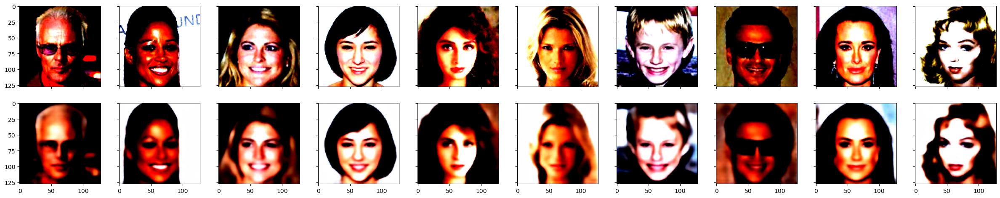

In [ ]:
from utils_data.utils_data_load import get_celeba_dataloaader_test

model.eval()

plot_generated_images(
    test_loader=test_loader,
    model=model
)

In [ ]:
#latent_size is equal to the encoder output
def plot_images_sampled_from_vae(model:VAE, unnormalizer=True, num_images=10):

        ##########################
        ### RANDOM SAMPLE
        ##########################   
        batch_size=BATCH_SIZE
        with torch.no_grad():
            input_vae = torch.rand(batch_size, 3, image_size, image_size, dtype=torch.float32, device=DEVICE)
            encoded_output, _, _ = model.encode(input_vae)
        
            rand_noise = torch.tensor((), dtype=torch.float32, device=DEVICE).new_empty((encoded_output.shape[0], encoded_output.shape[1])).uniform_(-1,1)
            decoded_images = model.decode(rand_noise).detach().to(torch.device('cpu')) 
        
        #matplotlob normalizer produces better images
        ''' 
        if unnormalizer:
            decoded_images = unnormalize_celeba(decoded_images)
        '''
        
        ##########################
        ### VISUALIZATION
        ##########################
        fig, axes = plt.subplots(nrows=1, ncols=num_images, figsize=(30, 5.5), sharey=True)
        
        for ax, img in zip(axes, decoded_images):
            curr_img = img
            curr_img = np.transpose(curr_img, (1, 2, 0))
            
            ax.imshow(curr_img, norm=matplotlib.colors.Normalize.
                                                autoscale(matplotlib.colors.Normalize,A=curr_img))

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

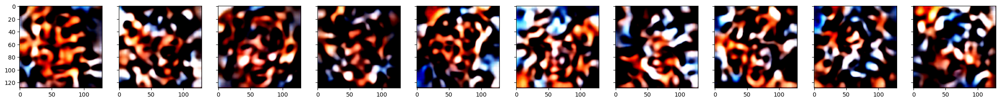

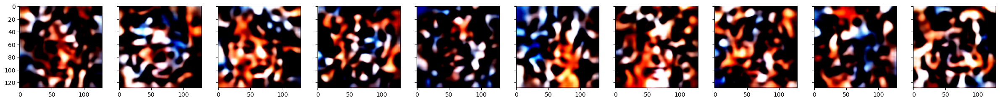

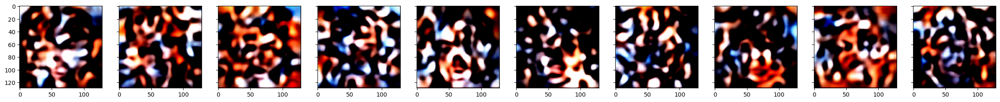

In [ ]:
for i in range(3):
    plot_images_sampled_from_vae(model=model)